# Understanding nighttime methane signals at the Amazon Tall Tower Observatory (ATTO)

### Santiago Botía B, et al., (2019)
### Plots for Sections 2.1 to 3.1


In [6]:
import sys
#sys.path.append('/pf/b/b301034/anaconda3/lib/python3.7/site-packages/')
# above lines needed when running from a different environment, not base
import numpy as np
import matplotlib as mpl
import matplotlib.pyplot as plt
from matplotlib.pyplot import *
import pandas as pd
import seaborn as sns
import scipy
from IPython.core.display import Image, display
from IPython.display import IFrame
import warnings
#warnings.filterwarnings("ignore")
%matplotlib inline

In [7]:
# Plot settings
line_width  = 0.7
marker_size = 2
font_size   = 5   # for paper 7

In [8]:
'''%%file foo.mplstyle
axes.labelsize : 7
lines.linewidth : 0.7
lines.markersize : 2
xtick.labelsize : 7
ytick.labelsize : 7'''

'%%file foo.mplstyle\naxes.labelsize : 7\nlines.linewidth : 0.7\nlines.markersize : 2\nxtick.labelsize : 7\nytick.labelsize : 7'

## Section 2. Data and Methods
### Figure 1. Site Map
- This map was done by Santiago Botia in QGIS. To get access to the original QGIS3 project, please contact: sbotia@bgc-jena.mpg.de

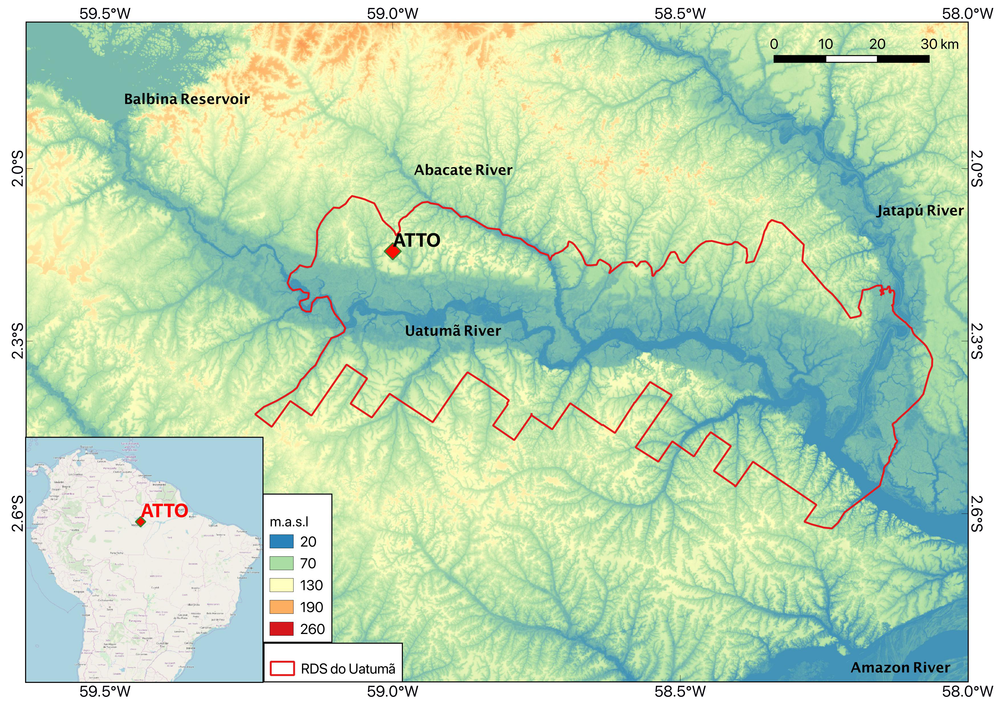

In [5]:
from PIL import Image
im  = Image.open('./Figures/MapATTOUatuma.jpg')
im

### Figure 2. Precipitation Plot

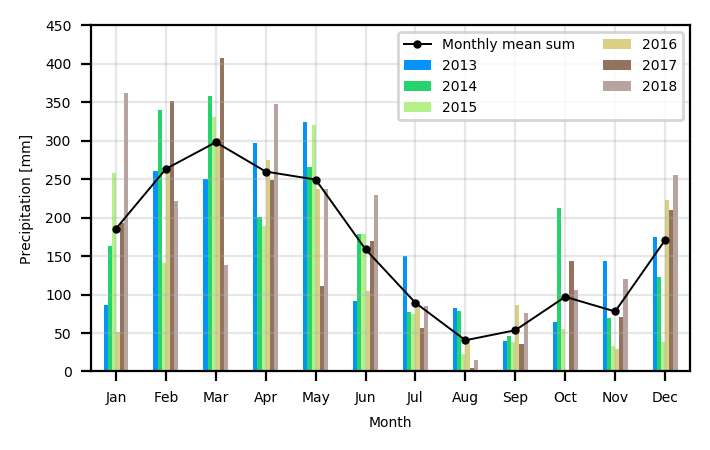

In [11]:
# The ddf_inst_data was generated in 03_DataMerging.ipynb
precip          = pd.read_pickle('./Data/df_inst_data')['Rainfall']
pre_monthly     = precip.groupby([precip.index.year,precip.index.month]).sum()
pre_monthly.drop(2019,inplace=True)
mean_month_rain = pre_monthly.groupby(pre_monthly.index.get_level_values(1)).mean()

fig,ax1         = plt.subplots(1,1,figsize=(3.5,2.2),dpi=200)
df              = pre_monthly.unstack(0)
df.plot(kind='bar', rot=0, ax=ax1, color=sns.color_palette(palette="terrain",n_colors=6))
plt.plot(mean_month_rain.values,color='k',marker='o',label='Monthly mean sum')

ax1.set_xlabel('Month')
ax1.set_ylabel('Precipitation [mm]')
ax1.grid(alpha=0.3)
ax1.legend(loc='best',ncol=2,fontsize=5)
ax1.set_xticklabels(['Jan','Feb','Mar','Apr','May','Jun','Jul','Aug','Sep','Oct','Nov','Dec'])
ax1.set_ylim(0,450)

mpl.rcParams['font.size'] = font_size
mpl.rcParams['lines.linewidth'] = line_width
mpl.rcParams['lines.markersize'] = marker_size
plt.tight_layout()
plt.show()
#fig.savefig('./Figures/ATTO_precipitation2013-2018.png',dpi=300)

## Section 3. Results and Discussion
### Section 3.1 Seasonal and diurnal patterns of CH4 gradients at ATTO

### Figure 3. Boxplot time series with gradient CH4
- Here I added an extra plot with the difference between 79m and all the other levels.
- To get the correct size of the figure in the paper one has to comment out the ax2 fig.
- The significance of the mean gradient is shown in the second plot. This plot is not shown in the paper, but I refer to the significance of all the dry season months.

In [12]:
# Importing data from ./Data. Dataframes were previuosly generated in DataMerging.ipynb
# These data at GHG concentrations at 30-minute resolution
months79  = pd.read_pickle('./Data/ATTO_CH4_79m')
months53  = pd.read_pickle('./Data/ATTO_CH4_53m')
months38  = pd.read_pickle('./Data/ATTO_CH4_38m')
months24  = pd.read_pickle('./Data/ATTO_CH4_24m')
months4   = pd.read_pickle('./Data/ATTO_CH4_4m')

gradient  = pd.DataFrame()
gradient  = gradient.assign(CH4_grad = months79['CH4[ppb]'] - months4['CH4[ppb]'])
gradient  = gradient.assign(Month = months79.Month)

# Generate array checking significance for each month. I am checking of the mean grad (79m - 4m) 
# is significantly different from zero, if it is, then it has a star.
m_iter    = np.unique(gradient['Month'].values)
array_sig = [] 
for i in m_iter:
    idx     = gradient['Month'] == i
    m_month = gradient[idx]['CH4_grad'].mean()
    p_val   = scipy.stats.ttest_1samp(gradient[idx]['CH4_grad'].dropna().values,popmean=0.0)[1]
    if p_val < 0.01:
        #print(i,m_month,p_val,'yes')
        array_sig.append('*')
    else:
        #print(i,m_month,p_val,'no')
        array_sig.append(' ')

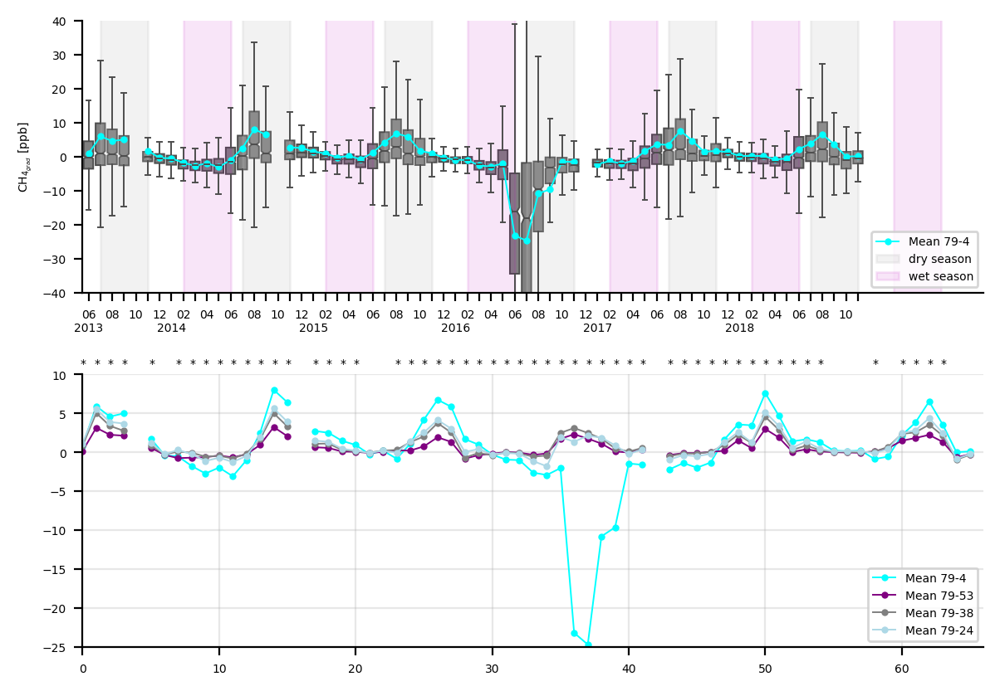

In [14]:
#fig, (ax,ax2)  = plt.subplots(2,1,figsize=(7,3),dpi=300)
fig, (ax,ax2)  = plt.subplots(2,1,figsize=(7,5),dpi=200)
sns.boxplot(x='Month',y='CH4_grad',data=gradient,notch=True,palette=['grey'],fliersize=0,ax=ax,linewidth=line_width)
sns.despine()

ax.plot(months79.groupby('Month').mean().values - months4.groupby('Month').mean().values,color='aqua',linestyle='-',marker='o',linewidth=line_width,label='Mean 79-4')
ax2.plot(months79.groupby('Month').mean().values - months4.groupby('Month').mean().values,color='aqua',linestyle='-',marker='o',linewidth=line_width,label='Mean 79-4')
ax2.plot(months79.groupby('Month').mean().values - months53.groupby('Month').mean().values,color='purple',linestyle='-',marker='o',linewidth=line_width,label='Mean 79-53')
ax2.plot(months79.groupby('Month').mean().values - months38.groupby('Month').mean().values,color='grey',linestyle='-',marker='o',linewidth=line_width,label='Mean 79-38')
ax2.plot(months79.groupby('Month').mean().values - months24.groupby('Month').mean().values,color='lightblue',linestyle='-',marker='o',linewidth=line_width,label='Mean 79-24')

for i,j in enumerate(array_sig):
    ax2.text(i-0.15,11,j,size=5)

labels = [item.get_text() for item in ax.get_xticklabels()]
months = [pd.to_datetime(i).strftime('%m') for i in labels]
years  = [pd.to_datetime(i).strftime('%Y') for i in labels]
lab    = []
for i in range(len(months)):
    if i == 0:
        lab.append('%s\n%s'%(months[i],years[i]))
        #lab.append('%s-%s'%(years[i],months[i]))
    elif months[i] == '01':
        lab.append(' \n%s'%(years[i]))
        #lab.append('%s-%s'%(years[i],months[i]))
    elif int(i)%2==0:
        #print(i,'yes')
        lab.append('%s'%(months[i]))
    else:
        #print(i,'no')
        lab.append(' ')

ax.set_ylim(-40,40)
ax2.set_ylim(-25,10)
ax2.set_xlim(0,66)
ax.set_xlabel(' ')
ax.set_ylabel('CH$_{4_{grad}}$ [ppb]')
plt.grid(alpha=0.3)
ax.set_xticklabels(lab)
for i in np.arange(0,66,12):
    if i == 0:
        ax.axvspan(xmin=1+i,xmax=5+i,ymax=2100,alpha=0.2,color='silver',label='dry season')
        ax.axvspan(xmin=8+i,xmax=12+i,ymax=2100,alpha=0.1,color='m',label='wet season')
    else:
        ax.axvspan(xmin=1+i,xmax=5+i,ymax=2100,alpha=0.2,color='silver')
        ax.axvspan(xmin=8+i,xmax=12+i,ymax=2100,alpha=0.1,color='m')

ax.legend(loc='lower right',frameon=True)
ax2.legend(loc='lower right',frameon=True)
plt.subplots_adjust(hspace=0.3)
plt.show()
#fig.savefig('./Plots_Paper1/CH4_grad_timeseries_79_4.png',dpi=300)

### Figure 4. Time percentage
- For the percentages written in text, please see Analysis.ipynb
- The dataframes imported below were generated in Analysis.ipynb

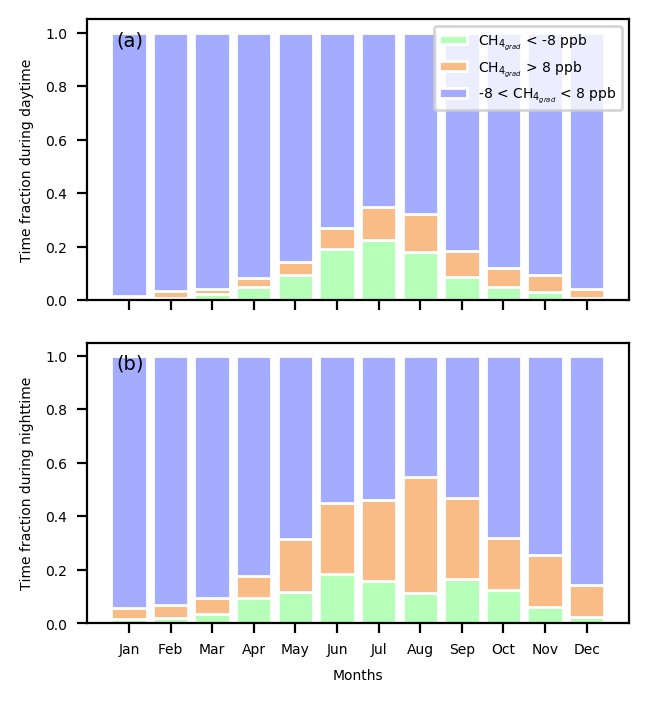

In [15]:
# The nighttime and daytime fractions were generated in 02_Analysis.ipynb
df_d      = pd.read_pickle('./Data/ATTO_Month_dayTime_timefrac')
df_n      = pd.read_pickle('./Data/ATTO_Month_nightTime_timefrac')

f         = plt.figure(figsize=(3.5,4),dpi=200)
grid      = plt.GridSpec(2,1,wspace=0.2,hspace=0.15)
ax1       = f.add_subplot(grid[0, 0])

barWidth  = 0.85
ax1.bar(df_d.Months, df_d.lower_than_minus8, color='#b5ffb9', edgecolor='white', width=barWidth,label='CH$_{4_{grad}}$ < -8 ppb')
ax1.bar(df_d.Months, df_d.greater_than8, bottom=df_d.lower_than_minus8, color='#f9bc86', edgecolor='white', width=barWidth, label = 'CH$_{4_{grad}}$ > 8 ppb')
ax1.bar(df_d.Months, df_d.Between_minus8_plus8, bottom=[i+j for i,j in zip(df_d.lower_than_minus8, df_d.greater_than8)], color='#a3acff', edgecolor='white', width=barWidth,label= '-8 < CH$_{4_{grad}}$ < 8 ppb')
ax1.set_ylabel('Time fraction during daytime',fontsize=font_size)
ax1.set_xticks(df_d.Months)
ax1.xaxis.set_ticklabels([''])
ax1.annotate('(a)', xy=(0.7,0.95),fontsize=7)
ax1.legend(loc='upper right',frameon=True,prop={'size':5})

ax2       = f.add_subplot(grid[1, 0])
ax2.bar(df_n.Months, df_n.lower_than_minus8, color='#b5ffb9', edgecolor='white', width=barWidth,label='CH$_{4_{grad}}$ [ppb] < -8 ppb')
ax2.bar(df_n.Months, df_n.greater_than8, bottom=df_n.lower_than_minus8.values, color='#f9bc86', edgecolor='white', width=barWidth,label = '> 8 ppb')
ax2.bar(df_n.Months, df_n.Between_minus8_plus8, bottom=[i+j for i,j in zip(df_n.lower_than_minus8, df_n.greater_than8)], color='#a3acff', edgecolor='white', width=barWidth,label= 'between -8 and 8 ppb')
ax2.set_ylabel('Time fraction during nighttime',fontsize=font_size)
ax2.set_xticks(df_n.Months)
ax2.xaxis.set_ticklabels(['Jan','Feb','Mar','Apr','May','Jun','Jul','Aug','Sep','Oct','Nov','Dec'])
ax2.annotate('(b)', xy=(0.7,0.95),fontsize=7)
ax2.set_xlabel('Months')
plt.rcParams.update({'font.size': 5})
#plt.tight_layout()
plt.show()
#f.savefig('./Plots_Paper1/time_percentage_day_night.png',dpi=300)

### Figure 5. Diurnal cycle for dry and wet season gradients

In [16]:
# Importing pickle file with concentrations.
# The pickle file was generated by Santiago Botia based on 30 minute averages given by David Walter.
d_clean_mod        = pd.read_pickle('./Data/ATTO_GHG_201203_201811_CO2avg')
ch4_30min          = d_clean_mod.iloc[:,10:15] # selecting methane
# calculating mean diurnal cycle, for each month
months_diurnal     = ch4_30min.groupby([ch4_30min.index.month,ch4_30min.index.hour]).mean() 
# Selecting wet and dry seasons
dry_season         = months_diurnal.loc[7:10]
wet_season         = months_diurnal.loc[2:5]
wet_season_diurnal = wet_season.groupby(level=1).mean()
dry_season_diurnal = dry_season.groupby(level=1).mean()
# wet season gradient
wet_grad           = wet_season.CH4_79 - wet_season.CH4_4
wet_grad_diu       = wet_grad.groupby(level=1).mean()
wet_grad_std       = wet_grad.groupby(level=1).std()
# dry season gradient
dry_grad = dry_season.CH4_79 - dry_season.CH4_4
dry_grad_diu = dry_grad.groupby(level=1).mean()
dry_grad_std = dry_grad.groupby(level=1).std()

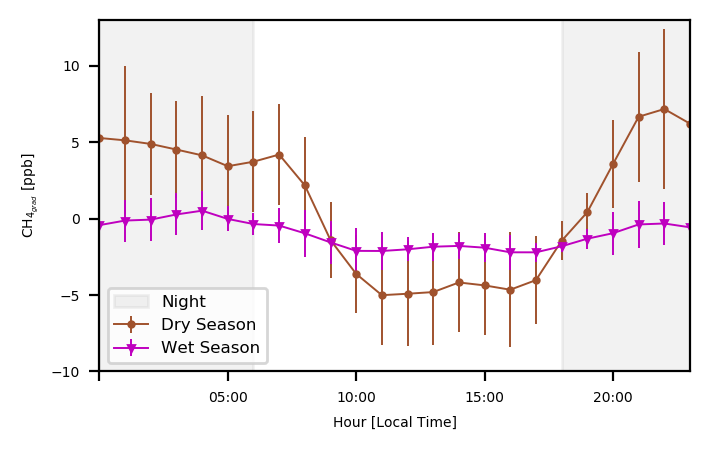

In [17]:
fig, med_left = plt.subplots(1,1,figsize=(3.5,2.2),dpi=200)
# plotting
med_left.errorbar(x=dry_grad_diu.index.values,y=dry_grad_diu.values,yerr=dry_grad_std.values,color='sienna',marker='o',label='Dry Season')
med_left.errorbar(x=wet_grad_diu.index.values,y=wet_grad_diu.values,yerr=wet_grad_std.values,color='m',marker='v',label='Wet Season')
#med_left.set_ylabel('[CH$_4$] at 79m - [CH$_4$] at 4m [ppb]')
med_left.set_ylabel('CH$_{4_{grad}}$ [ppb]')
med_left.set_xlabel('Hour [Local Time]')
med_left.set_xlim(0,23)
med_left.set_ylim(-10,13)
med_left.set_xticklabels([' ','05:00','10:00','15:00','20:00'])
med_left.axvspan(xmin=0,xmax=6,ymax=8,alpha=0.1,color='grey')
med_left.axvspan(xmin=18,xmax=23,ymax=8,alpha=0.1,color='grey',label='Night')
med_left.legend(loc='lower left',frameon=True,prop={'size':6})

mpl.rcParams['font.size'] = font_size
mpl.rcParams['lines.linewidth'] = line_width
mpl.rcParams['lines.markersize'] = marker_size
plt.tight_layout()
plt.show()
#fig.savefig('./Figures/ATTO_diurnal.png',dpi=300)

### Figure 6. Single events
- This has to be done with the same data as in 1min_merging in my local comp. As it is here, I need to change the night in Aug 2014 to 07:00. I decided to leave as it is. 
- I also included here wind direction which is not in the paper.

In [19]:
# Importing a merged dataframe including concentrations, met variables, and soil variables
# These dataframe was generated in 03_DataMerging.ipynb, 30-minute resolution
df_ch4_metvars = pd.read_pickle('./Data/ATTO_GHG_Inst_flux_soil_30min')

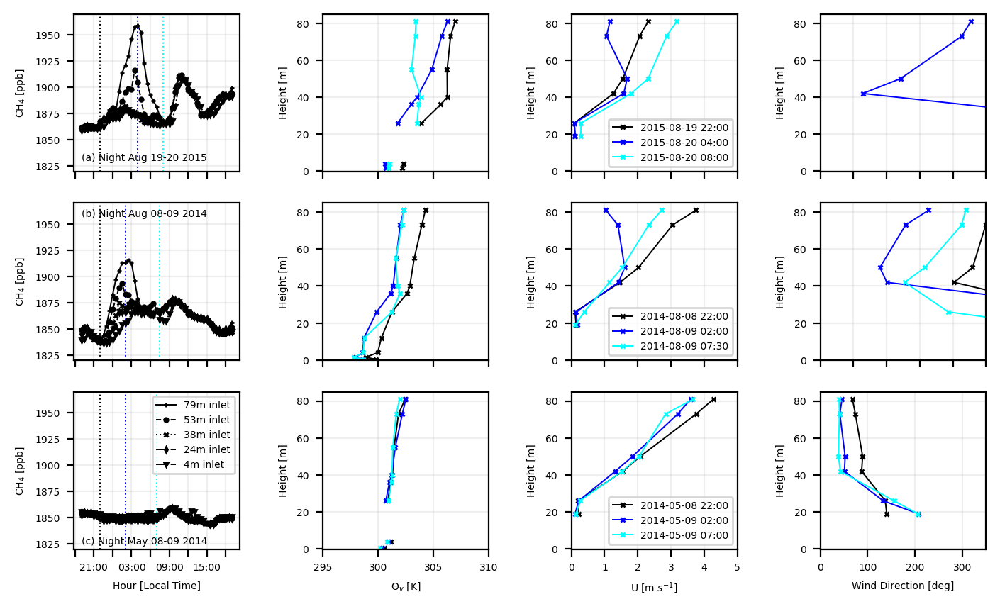

In [20]:
fig       = plt.figure(figsize=(8.3, 5),dpi=200)
grid      = plt.GridSpec(3,4,wspace=0.5,hspace=0.2)
maxx_y    = 1970

#====================================================== Primera Fila
bot_right = fig.add_subplot(grid[0, 0])
ini       = '2015-08-19 19:00'
end       = '2015-08-20 19:00'
t_vline1  = '2015-08-19 22:00'
t_vline2  = '2015-08-20 04:00'
t_vline3  = '2015-08-20 08:00'

bot_right.plot(ch4_30min.loc[ini:end,'CH4_79'],linestyle='-',marker='+',markersize=marker_size,color='k',label='79m inlet',linewidth=line_width)
bot_right.plot(ch4_30min.loc[ini:end,'CH4_53'],linestyle='--',marker='o',markersize=marker_size,color='k',label='53m inlet',linewidth=line_width)
bot_right.plot(ch4_30min.loc[ini:end,'CH4_38'],linestyle=':',marker='x',markersize=marker_size,color='k',label='38m inlet',linewidth=line_width)
bot_right.plot(ch4_30min.loc[ini:end,'CH4_24'],linestyle='-.',marker='d',markersize=marker_size,color='k',label='24m inlet',linewidth=line_width)
bot_right.plot(ch4_30min.loc[ini:end,'CH4_4'],linestyle='-.',marker='v',markersize=marker_size,color='k',label='4m inlet',linewidth=line_width)
bot_right.set_ylabel('CH$_4$ [ppb]')
bot_right.set_ylim(1820,maxx_y)
bot_right.vlines(t_vline1,1820,maxx_y,linestyles=':',linewidth=line_width,color='k')
bot_right.vlines(t_vline2,1820,maxx_y,linestyles=':',linewidth=line_width,color='blue')
bot_right.vlines(t_vline3,1820,maxx_y,linestyles=':',linewidth=line_width,color='cyan')
bot_right.annotate('(a) Night Aug 19-20 2015', xy=('2015-08-19 19:00',1830),fontsize=font_size)
bot_right.set_xticklabels([''])#,'14:00','16:00','18:00:','20:00'])
bot_right.grid(alpha=0.2)

#====================
ax2       = fig.add_subplot(grid[0, 1])
y         = [81,73,55,40,36,26,12,4,1.5]
x         = df_ch4_metvars.loc[t_vline1,['PotVirt_81m','PotVirt_73m','PotVirt_55m','PotVirt_40m','PotVirt_36m','PotVirt_26m','PotVirt_12m','PotVirt_4m','PotVirt_1_5m','PotVirt_0_4m']].values.flatten()
x2        = df_ch4_metvars.loc[t_vline2,['PotVirt_81m','PotVirt_73m','PotVirt_55m','PotVirt_40m','PotVirt_36m','PotVirt_26m','PotVirt_12m','PotVirt_4m','PotVirt_1_5m','PotVirt_0_4m']].values.flatten()
x3        = df_ch4_metvars.loc[t_vline3,['PotVirt_81m','PotVirt_73m','PotVirt_55m','PotVirt_40m','PotVirt_36m','PotVirt_26m','PotVirt_12m','PotVirt_4m','PotVirt_1_5m','PotVirt_0_4m']].values.flatten()

ax2.plot(x[:-1],y,marker='x',label=t_vline1,color='k',linewidth=line_width,markersize=marker_size)
ax2.plot(x2[:-1],y,marker='x',label=t_vline2,color='blue',linewidth=line_width,markersize=marker_size)
ax2.plot(x3[:-1],y,marker='x',label=t_vline3,color='cyan',linewidth=line_width,markersize=marker_size)
ax2.set_ylabel('Height [m]')
ax2.set_xlim(295,310)
ax2.set_ylim(-0.1,85)
ax2.set_xticklabels([''])
ax2.grid(alpha=0.2)


#====================
ax7       =  fig.add_subplot(grid[0, 2])
y         = [81,73,50,42,26,19]
x         = df_ch4_metvars.loc[t_vline1,['Mean_Windsp[m/s]','WSp_73m', 'WSp_50m', 'WSp_42m','WSp_26m', 'WSp_19m']].values.flatten()
x2        = df_ch4_metvars.loc[t_vline2,['Mean_Windsp[m/s]','WSp_73m', 'WSp_50m', 'WSp_42m','WSp_26m', 'WSp_19m']].values.flatten()
x3        = df_ch4_metvars.loc[t_vline3,['Mean_Windsp[m/s]','WSp_73m', 'WSp_50m', 'WSp_42m','WSp_26m', 'WSp_19m']].values.flatten()

ax7.plot(x,y,marker='x',label=t_vline1,color='k',linewidth=line_width,markersize=marker_size)
ax7.plot(x2,y,marker='x',label=t_vline2,color='blue',linewidth=line_width,markersize=marker_size)
ax7.plot(x3,y,marker='x',label=t_vline3,color='cyan',linewidth=line_width,markersize=marker_size)
ax7.set_ylabel('Height [m]')
ax7.set_ylim(-0.1,85)
ax7.set_xlim(0,5)
ax7.set_xticklabels([''])
ax7.grid(alpha=0.2)
ax7.legend(loc='lower right',prop={'size':5})

#====================
ax8       =  fig.add_subplot(grid[0, 3])
y         = [81,73,50,42,26,19]
x         = df_ch4_metvars.loc[t_vline1,['Wind-Direc-corrg[deg]','WDir_73m', 'WDir_50m', 'WDir_42m','WDir_26m', 'WDir_19m']].values.flatten()
x2        = df_ch4_metvars.loc[t_vline2,['Wind-Direc-corrg[deg]','WDir_73m', 'WDir_50m', 'WDir_42m','WDir_26m', 'WDir_19m']].values.flatten()
x3        = df_ch4_metvars.loc[t_vline3,['Wind-Direc-corrg[deg]','WDir_73m', 'WDir_50m', 'WDir_42m','WDir_26m', 'WDir_19m']].values.flatten()

ax8.plot(x,y,marker='x',label=t_vline1,color='k')
ax8.plot(x2,y,marker='x',label=t_vline2,color='blue')
ax8.plot(x3,y,marker='x',label=t_vline3,color='cyan')
ax8.set_ylabel('Height [m]')
ax8.set_ylim(-0.1,85)
ax8.set_xlim(0,100)
ax8.set_xticklabels([''])
ax8.grid(alpha=0.2)
#ax8.legend(loc='lower right',prop={'size':5})

#====================================================== Segunda Fila
bot_r     =  fig.add_subplot(grid[1, 0])
ini       = '2014-08-08 19:00'
end       = '2014-08-09 19:00'
t_vline1  = '2014-08-08 22:00'
t_vline2  = '2014-08-09 02:00'
t_vline3  = '2014-08-09 07:30'

#ini       = '2014-08-20 19:00'
#end       = '2014-08-21 19:00'
#t_vline1  = '2014-08-20 22:00'
#t_vline2  = '2014-08-21 02:00'
#t_vline3  = '2014-08-21 07:00'

bot_r.plot(df_ch4_metvars.loc[ini:end,'CH4_79'],linestyle='-',marker='+',color='k',label='79m inlet',linewidth=line_width,markersize=marker_size)
bot_r.plot(df_ch4_metvars.loc[ini:end,'CH4_53'],linestyle='--',marker='o',color='k',label='53m inlet',linewidth=line_width,markersize=marker_size)
bot_r.plot(df_ch4_metvars.loc[ini:end,'CH4_38'],linestyle=':',marker='x',color='k',label='38m inlet',linewidth=line_width,markersize=marker_size)
bot_r.plot(df_ch4_metvars.loc[ini:end,'CH4_24'],linestyle='-.',marker='d',color='k',label='24m inlet',linewidth=line_width,markersize=marker_size)
bot_r.plot(df_ch4_metvars.loc[ini:end,'CH4_4'],linestyle='-.',marker='v',color='k',label='4m inlet',linewidth=line_width,markersize=marker_size)
bot_r.vlines(t_vline1,1820,maxx_y,linestyles=':',linewidth=line_width,color='k')
bot_r.vlines(t_vline2,1820,maxx_y,linestyles=':',linewidth=line_width,color='blue')
bot_r.vlines(t_vline3,1820,maxx_y,linestyles=':',linewidth=line_width,color='cyan')

bot_r.set_ylabel('CH$_4$ [ppb]')
bot_r.set_ylim(1820,maxx_y)
bot_r.set_xticklabels([' '])
bot_r.grid(alpha=0.2)
bot_r.annotate('(b) Night Aug 08-09 2014', xy=(ini,maxx_y-13),fontsize=font_size)

#====================
ax3       =  fig.add_subplot(grid[1, 1])
y         = [81,73,55,40,36,26,12,4,1.5,0.4]
x         = df_ch4_metvars.loc[t_vline1,['PotVirt_81m','PotVirt_73m','PotVirt_55m','PotVirt_40m','PotVirt_36m','PotVirt_26m','PotVirt_12m','PotVirt_4m','PotVirt_1_5m','PotVirt_0_4m']].values.flatten()
x2        = df_ch4_metvars.loc[t_vline2,['PotVirt_81m','PotVirt_73m','PotVirt_55m','PotVirt_40m','PotVirt_36m','PotVirt_26m','PotVirt_12m','PotVirt_4m','PotVirt_1_5m','PotVirt_0_4m']].values.flatten()
x3        = df_ch4_metvars.loc[t_vline3,['PotVirt_81m','PotVirt_73m','PotVirt_55m','PotVirt_40m','PotVirt_36m','PotVirt_26m','PotVirt_12m','PotVirt_4m','PotVirt_1_5m','PotVirt_0_4m']].values.flatten()

ax3.plot(x,y,marker='x',label=t_vline1,color='k',linewidth=line_width,markersize=marker_size)
ax3.plot(x2,y,marker='x',label=t_vline2,color='blue',linewidth=line_width,markersize=marker_size)
ax3.plot(x3,y,marker='x',label=t_vline3,color='cyan',linewidth=line_width,markersize=marker_size)
ax3.set_ylabel('Height [m]')
ax3.set_xlim(295,310)
ax3.set_ylim(-0.1,85)
#ax2.annotate('(a) Night Aug 19-20 2015', xy=('2015-08-19 19:00',maxx_y-10),fontsize=13)
ax3.set_xticklabels([''])
ax3.grid(alpha=0.2)

#====================
ax6       =  fig.add_subplot(grid[1, 2])
y         = [81,73,50,42,26,19]
x         = df_ch4_metvars.loc[t_vline1,['Mean_Windsp[m/s]','WSp_73m', 'WSp_50m', 'WSp_42m','WSp_26m', 'WSp_19m']].values.flatten()
x2        = df_ch4_metvars.loc[t_vline2,['Mean_Windsp[m/s]','WSp_73m', 'WSp_50m', 'WSp_42m','WSp_26m', 'WSp_19m']].values.flatten()
x3        = df_ch4_metvars.loc[t_vline3,['Mean_Windsp[m/s]','WSp_73m', 'WSp_50m', 'WSp_42m','WSp_26m', 'WSp_19m']].values.flatten()

ax6.plot(x,y,marker='x',label=t_vline1,color='k',linewidth=line_width,markersize=marker_size)
ax6.plot(x2,y,marker='x',label=t_vline2,color='blue',linewidth=line_width,markersize=marker_size)
ax6.plot(x3,y,marker='x',label=t_vline3,color='cyan',linewidth=line_width,markersize=marker_size)
ax6.set_ylabel('Height [m]')
ax6.set_ylim(-0.1,85)
ax6.set_xlim(0,5)
ax6.set_xticklabels([''])
ax6.grid(alpha=0.2)
ax6.legend(loc='lower right',prop={'size':5})

#====================
ax9       =  fig.add_subplot(grid[1, 3])
y         = [81,73,50,42,26,19]
x         = df_ch4_metvars.loc[t_vline1,['Wind-Direc-corrg[deg]','WDir_73m', 'WDir_50m', 'WDir_42m','WDir_26m', 'WDir_19m']].values.flatten()
x2        = df_ch4_metvars.loc[t_vline2,['Wind-Direc-corrg[deg]','WDir_73m', 'WDir_50m', 'WDir_42m','WDir_26m', 'WDir_19m']].values.flatten()
x3        = df_ch4_metvars.loc[t_vline3,['Wind-Direc-corrg[deg]','WDir_73m', 'WDir_50m', 'WDir_42m','WDir_26m', 'WDir_19m']].values.flatten()

ax9.plot(x,y,marker='x',label=t_vline1,color='k')
ax9.plot(x2,y,marker='x',label=t_vline2,color='blue')
ax9.plot(x3,y,marker='x',label=t_vline3,color='cyan')
ax9.set_ylabel('Height [m]')
ax9.set_ylim(-0.1,85)
ax9.set_xlim(0,100)
ax9.set_xticklabels([''])
ax9.grid(alpha=0.2)
#ax9.legend(loc='lower right',prop={'size':5})

#====================================================== Tercera Fila

ax1       =  fig.add_subplot(grid[2, 0])
ini       = '2014-05-08 19:00'
end       = '2014-05-09 19:00'
t_vline1  = '2014-05-08 22:00'
t_vline2  = '2014-05-09 02:00'
t_vline3  = '2014-05-09 07:00'

ax1.plot(df_ch4_metvars.loc[ini:end,'CH4_79'],linestyle='-',marker='+',color='k',label='79m inlet',linewidth=line_width,markersize=marker_size)
ax1.plot(df_ch4_metvars.loc[ini:end,'CH4_53'],linestyle='--',marker='o',color='k',label='53m inlet',linewidth=line_width,markersize=marker_size)
ax1.plot(df_ch4_metvars.loc[ini:end,'CH4_38'],linestyle=':',marker='x',color='k',label='38m inlet',linewidth=line_width,markersize=marker_size)
ax1.plot(df_ch4_metvars.loc[ini:end,'CH4_24'],linestyle='-.',marker='d',color='k',label='24m inlet',linewidth=line_width,markersize=marker_size)
ax1.plot(df_ch4_metvars.loc[ini:end,'CH4_4'],linestyle='-.',marker='v',color='k',label='4m inlet',linewidth=line_width,markersize=marker_size)
ax1.vlines(t_vline1,1820,maxx_y,linestyles=':',color='k',linewidth=line_width)
ax1.vlines(t_vline2,1820,maxx_y,linestyles=':',color='blue',linewidth=line_width)
ax1.vlines(t_vline3,1820,maxx_y,linestyles=':',color='cyan',linewidth=line_width)

ax1.set_ylabel('CH$_4$ [ppb]')
ax1.set_xlabel('Hour [Local Time]')
ax1.set_ylim(1820,maxx_y)
ax1.set_xticklabels([' ','21:00',' ','03:00',' ','09:00',' ','15:00',' '],fontsize=font_size)
ax1.legend(frameon=True,prop={'size':5})
ax1.grid(alpha=0.2)
ax1.annotate('(c) Night May 08-09 2014', xy=(ini,1825),fontsize=font_size)

#====================
ax4       =  fig.add_subplot(grid[2, 1])
y         = [81,73,55,40,36,26,12,4,1.5,0.4]
x         = df_ch4_metvars.loc[t_vline1,['PotVirt_81m','PotVirt_73m','PotVirt_55m','PotVirt_40m','PotVirt_36m','PotVirt_26m','PotVirt_12m','PotVirt_4m','PotVirt_1_5m','PotVirt_0_4m']].values.flatten()
x2        = df_ch4_metvars.loc[t_vline2,['PotVirt_81m','PotVirt_73m','PotVirt_55m','PotVirt_40m','PotVirt_36m','PotVirt_26m','PotVirt_12m','PotVirt_4m','PotVirt_1_5m','PotVirt_0_4m']].values.flatten()
x3        = df_ch4_metvars.loc[t_vline3,['PotVirt_81m','PotVirt_73m','PotVirt_55m','PotVirt_40m','PotVirt_36m','PotVirt_26m','PotVirt_12m','PotVirt_4m','PotVirt_1_5m','PotVirt_0_4m']].values.flatten()

ax4.plot(x,y,marker='x',label=t_vline1,color='k',linewidth=line_width,markersize=marker_size)
ax4.plot(x2,y,marker='x',label=t_vline2,color='blue',linewidth=line_width,markersize=marker_size)
ax4.plot(x3,y,marker='x',label=t_vline3,color='cyan',linewidth=line_width,markersize=marker_size)
ax4.set_ylabel('Height [m]')
ax4.set_xlabel('$\Theta_{v}$ [K]')
ax4.set_xlim(295,310)
ax4.set_ylim(-0.1,85)
#ax4.set_xticklabels([''])
ax4.grid(alpha=0.2)
#ax4.legend()

#====================
ax5       =  fig.add_subplot(grid[2, 2])
y         = [81,73,50,42,26,19]
x         = df_ch4_metvars.loc[t_vline1,['Mean_Windsp[m/s]','WSp_73m', 'WSp_50m', 'WSp_42m','WSp_26m', 'WSp_19m']].values.flatten()
x2        = df_ch4_metvars.loc[t_vline2,['Mean_Windsp[m/s]','WSp_73m', 'WSp_50m', 'WSp_42m','WSp_26m', 'WSp_19m']].values.flatten()
x3        = df_ch4_metvars.loc[t_vline3,['Mean_Windsp[m/s]','WSp_73m', 'WSp_50m', 'WSp_42m','WSp_26m', 'WSp_19m']].values.flatten()

ax5.plot(x,y,marker='x',label=t_vline1,color='k',linewidth=line_width,markersize=marker_size)
ax5.plot(x2,y,marker='x',label=t_vline2,color='blue',linewidth=line_width,markersize=marker_size)
ax5.plot(x3,y,marker='x',label=t_vline3,color='cyan',linewidth=line_width,markersize=marker_size)
ax5.set_ylabel('Height [m]')
ax5.set_xlabel('U [m $s^{-1}$]')
ax5.set_ylim(-0.1,85)
ax5.set_xlim(0,5)
ax5.grid(alpha=0.2)
ax5.legend(loc='lower right',prop={'size':5})

#====================
ax10      =  fig.add_subplot(grid[2, 3])
y         = [81,73,50,42,26,19]
x         = df_ch4_metvars.loc[t_vline1,['Wind-Direc-corrg[deg]','WDir_73m', 'WDir_50m', 'WDir_42m','WDir_26m', 'WDir_19m']].values.flatten()
x2        = df_ch4_metvars.loc[t_vline2,['Wind-Direc-corrg[deg]','WDir_73m', 'WDir_50m', 'WDir_42m','WDir_26m', 'WDir_19m']].values.flatten()
x3        = df_ch4_metvars.loc[t_vline3,['Wind-Direc-corrg[deg]','WDir_73m', 'WDir_50m', 'WDir_42m','WDir_26m', 'WDir_19m']].values.flatten()

ax10.plot(x,y,marker='x',label=t_vline1,color='k')
ax10.plot(x2,y,marker='x',label=t_vline2,color='blue')
ax10.plot(x3,y,marker='x',label=t_vline3,color='cyan')
ax10.set_ylabel('Height [m]')
ax10.set_xlabel('Wind Direction [deg]')
ax10.set_ylim(-0.1,85)
ax10.set_xlim(0,350)
ax10.grid(alpha=0.2)
#ax10.legend(loc='lower right',prop={'size':5})

#plt.rcParams.update({'font.size': 18})
plt.show()
#fig.savefig('./Plots_Paper1/SingleNights_cases_U_VirtTempProf_ft18_30mindata.png',dpi=300)